In [ ]:
!pip install --upgrade pip   # อัปเดตตัวจัดการแพ็กเกจ pip
!pip install tensorflow      # ติดตั้ง TensorFlow สำหรับ CPU และ GPU

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 24.9 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2


# (1.) เตรียมข้อมูล

Dataset ในบทนี้ เป็นข้อมูลเกี่ยวกับมะเร็ง(Breast cancer) ซึ่งได้จากข้อมูลภาพดิจิทัลของชิ้นเนื้อ เก็บโดยการใช้เข็มเจาะเพื่อดูดชิ้นเนื้อหรือเซลล์(FNA: Fine Needle Aspiration) นำไปตรวจแล้วบันทึกข้อมูล แต่ละเคส(แต่ละ Sample)
- ชุดข้อมูลมีจำนวน 560 รายการ(560 Samples)
- Feature: จำนวน 30 คอลัมน์(30 ตัวแปร) ประกอบด้วยค่าขนาดต่างๆของ Samples เช่น รัศมีเฉลี่ย(mean radius) ค่าเบี่ยงเบนมาตรฐาน Pixel ค่าราบเรียบ พื้นที่(area) และอื่นๆ
- Class/Target/Label: สถานะหรือผลตรวจ 0 คือ Malignant(เนื้อร้ายหรือมะเร็ง) และ Begin(ไม่เป็นมะเร็ง)

ค่า Feature หลายๆตัว อาจไม่รู้จักคืออะไร แต่ก็ไม่เป็นไร ไม่จำเป็นต้องรู้ทั้งหมด

## โหลดข้อมูล

In [ ]:
from sklearn.datasets import load_breast_cancer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

cancer = load_breast_cancer()
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [ ]:
cancer

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
         1.189e-01],
        [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
         8.902e-02],
        [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
         8.758e-02],
        ...,
        [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
         7.820e-02],
        [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
         1.240e-01],
        [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
         7.039e-02]]),
 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
        1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
        1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0

dict_key ทั้งหมด ในที่นี้ต้องการใช้ data(ข้อมูล) และ feature_names (ชื่อ Feature หรือชื่อตัวแปร หรือชื่อคอลัมน์นั่นเอง) ให้ทำการเก็บข้อมูลไว้ใน DataFrame เพื่อให้ง่ายต่อการประมวลผล โดยตัวอย่างนี้ ยกมาเพียง 2 Feature ประกอบการอธิบายเท่านั้น(ทั้งหมดมี 30)

In [ ]:
# ข้อมูล และ ชื่อตัวแปร (Feature) ตัดเอามาใช้เพียง 2 คอลัมน์ คือ mean radian, mean texture
df = pd.DataFrame(cancer.data[:,0:2], columns=cancer.feature_names[0:2])
df['class'] = cancer.target   # เพิ่มคอลัมน์ class(Target/Label) (เป็นมะเร็ง หรือไม่เป็น)
df.sample(5, random_state=1)  # สุ่มให้ได้เหมือนเดิมทุกครั้ง

,mean radius,mean texture,class
421,14.69,13.98,1
47,13.17,18.66,0
292,12.95,16.02,1
186,18.31,18.58,0
414,15.13,29.81,0


การเข้ารหัส(Label Encoding) คือ การเปลี่ยน class ข้อมูลชนิดข้อความให้เป็นตัวเลข

เพื่อให้เห็นถึงวิธีการ ต้องจำลองสถานการณ์ โดยการเปลี่ยน class จาก 0, 1 ให้เป็นข้อความ(malignant, benign)

In [ ]:
# ใช้แบบนี้ก็ได้
# df['class'] = np.where(df['class']==0, 'yes', 'no')
# df['class'] = np.where(df['class']==0, 'malignant', 'benign')

target_map = {0:'malignant', 1:'benign'}  # เปลี่ยนจาก 0 1 เป็นข้อความ
df['class'] = df['class'].map(target_map)

df.sample(5, random_state=1)  # สุ่มให้ได้เหมือนเดิมทุกครั้ง

,mean radius,mean texture,class
421,14.69,13.98,benign
47,13.17,18.66,malignant
292,12.95,16.02,benign
186,18.31,18.58,malignant
414,15.13,29.81,malignant


In [ ]:
df.isnull().sum()

mean radius     0
mean texture    0
class           0
dtype: int64

ไม่มีข้อมูลสูญหาย

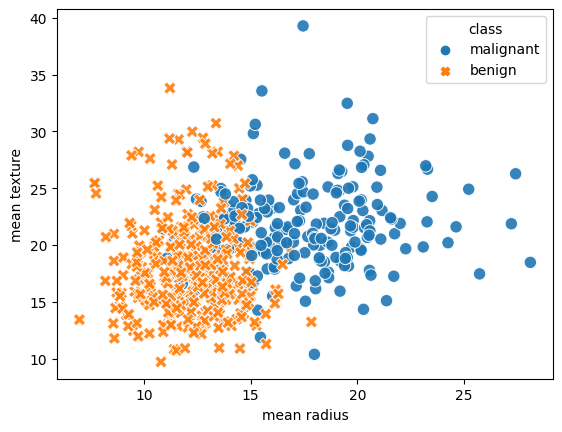

In [ ]:
sns.scatterplot(x='mean radius', y='mean texture', data=df, hue='class',
                style='class', alpha=0.9, edgecolor='w', s=80)
plt.show()

- จุด x คือ กลุ่มที่ไม่เป็นมะเร็ง (class=1) ส่วนจุด o คือกลุ่มที่เป็นมะเร็ง(class=0)
- ส่วนที่ไม่เป็นมะเร็ง อยู่กลุ่มด้านซ้ายๆ ส่วนที่เป็นมะเร็งอยู่ด้านขวาๆ
- ทั้ง 2 กลุ่ม มีช่วงคาบเกี่ยวกันอยู่ตรงกลางๆ

## เข้ารหัส Label Encoding

แทนที่ข้อความด้วยตัวเลข

In [ ]:
class_names, y = np.unique(df['class'], return_inverse=True)  # เข้ารหัส
class_names   # มี 2 คลาส

array(['benign', 'malignant'], dtype=object)

In [ ]:
y[40:50]  # กลายเป็น 0 1

array([1, 1, 1, 1, 1, 1, 0, 1, 0, 0])

เตรียมข้อมูล Feature(X) โดยตัด class ออกไป จะเหลือ mean radius และ mean texture

In [ ]:
X = df.drop('class', axis=1)
X.head()

,mean radius,mean texture
0,17.99,10.38
1,20.57,17.77
2,19.69,21.25
3,11.42,20.38
4,20.29,14.34


## ปรับค่าข้อมูลเป็น Standard Scale

Feature(X) scaling หรือ Data scailing

In [ ]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_sc = sc.fit_transform(X)
X_sc[:5]

array([[ 1.09706398, -2.07333501],
       [ 1.82982061, -0.35363241],
       [ 1.57988811,  0.45618695],
       [-0.76890929,  0.25373211],
       [ 1.75029663, -1.15181643]])

พล็อตดูข้อมูล เพื่อเปรียบเทียบก่อนและหลังทำ Standard scale จะพบว่าค่า mean ของทั้งสอง อยู่ที่ 0

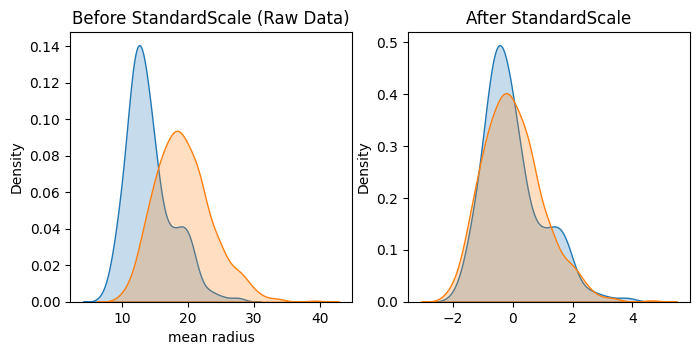

In [ ]:
fig, (ax_1, ax_2) = plt.subplots(ncols=2, figsize=(8, 3.5))

ax_1.set_title('Before StandardScale (Raw Data)')
sns.kdeplot(df['mean radius'], fill=True, ax=ax_1)
sns.kdeplot(df['mean texture'], fill=True, ax=ax_1)

ax_2.set_title('After StandardScale')
sns.kdeplot(X_sc[:,0], fill=True, ax=ax_2)
sns.kdeplot(X_sc[:,1], fill=True, ax=ax_2)
plt.show()

ก่อนและหลังการทำ Standard scale(X_sc) จะพบว่า การกระจายข้อมูลหลังทำได้ค่าน้อยลง แต่ไม่ได้ทำให้การกระจายของข้อมูลเปลี่ยนไป(ไม่ได้ทำให้ผลการจำแนกเปลี่ยนไป)

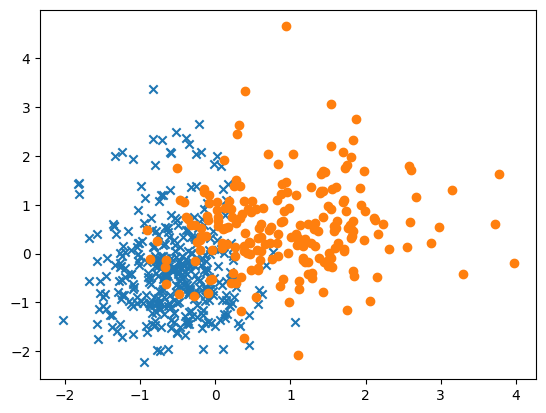

In [ ]:
plt.scatter(X_sc[:,0][y==0], X_sc[:,1][y==0], marker='x')    # จุดข้อมูลกรณี y=0
plt.scatter(X_sc[:,0][y==1], X_sc[:,1][y==1])
plt.show()

## เตรียมข้อมูล Train และ Test

แบ่งข้อมูล Train และ Test โดยตัว Train ใช้ค่า X_sc(ผ่าน Standard scale แล้ว)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_sc, y,
                                                    test_size=0.25,   # Test สัดส่วน 25%
                                                    random_state=1)
X_train.shape, X_test.shape

((426, 2), (143, 2))

- Train มีจำนวน 426 Samples (2 Feature)
- Test มีจำนวน 143 Samples (2 Feature เท่ากัน)

In [ ]:
y_train.shape, y_test.shape

((426,), (143,))

- Train มีจำนวน 426 แถว(ต้องเท่ากับ X_train), 1 คอลัมน์
- Test มีจำนวน 143 แถว 1 คอลัมน์

ลองดูข้อมูลคร่าวๆ

In [ ]:
X_train[:5]

array([[ 0.31034466,  2.63664885],
       [ 0.23650097, -0.04413248],
       [ 0.15697699,  0.19555543],
       [-1.0813249 , -0.68407594],
       [-0.64678318, -0.42577149]])

In [ ]:
y_train[:5]

array([1, 0, 1, 0, 0])

# (2.) สร้าง Model

ภาพรวมกระบวนการสร้าง Model รวมถึงการ Train Model ด้วย TensorFlow Keras มีดังนี้
- สร้างเครือข่าย (คล้ายกับตั้งโครงสร้าง NN ไว้ก่อน)
- Compile
- ทำการ Train
- ประเมินทดสอบ และดูผล

## สร้างเครือข่าย

คือการสร้าง NN หรือสร้าง Model ด้วย NN นั้นเอง มีโครงสร้างดังนี้

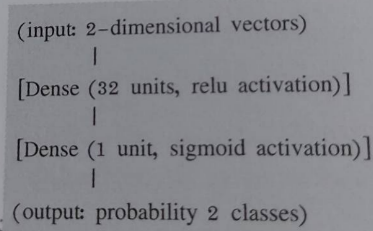
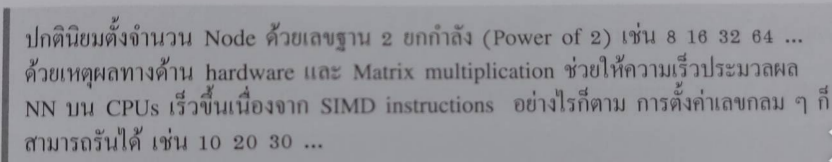

## เขียนโค้ดแบบ Sequential Model

มีลักษณะเป็นลำดับ(Sequence) เหมือนกับการสร้างชั้น Layer ต่อๆกันไป เช่น เริ่ม Instance ตัว Model ก่อน จากนั้นก็เพิ่มชั้น Layer เข้าไปทีละชั้น(.add) โดยแต่ละชั้นกำหนดจำนวน Node ที่ต้องการด้วย Dense ดังนี้

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

model = Sequential()    # เริ่มต้นสร้าง Instance

# เพิ่มชั้น Layer มีจำนวน 32 Nodes โดยกำหนดให้ใช้ Activation function ReLU
# input_shape คือ มิติรับอินพุต ซึ่งในตัวอย่างนี้คือ 2 Feature
model.add(Dense(32, activation='relu', input_shape=(2,)))

# เพิ่มชั้น Output Layer มีจำนวน 1 Node และใช้ Activation function Sigmoid
# ในกรณีนี้จำแนก Classify เพียงแค่ 0 1 ดังนั้นใช้ 1 Node
model.add(Dense(1, activation='sigmoid'))
model

In [ ]:
# หรือเขียนแบบนี้ก็ได้
model = Sequential([
    Dense(32, activation='relu', input_shape=(2,)),
    Dense(1, activation='sigmoid')
])

## เขียนโค้ดรูปแบบ Functional Model

เป็นอีกรูปแบบหนึ่ง ซึ่งสามารถสร้าง Model ที่ซับซ้อนมากกว่าแบบ Sequence ได้แก่ การแชร์ Layer และรองรับหลาย Input Output (Multiple inputs outputs) ในบทนี้ยังไม่ซับซ้อนมาก ใช้วิธีใดก็ได้ (วิธี Sequence น่าจะง่ายกว่า)

In [ ]:
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras import Model

inputo = Input(shape=(2,))
x = Dense(32,  activation='relu')(inputo)

outputo = Dense(1, activation='sigmoid')(x)

model=Model(inputs=inputo, outputs=outputo, name="my_model")
model

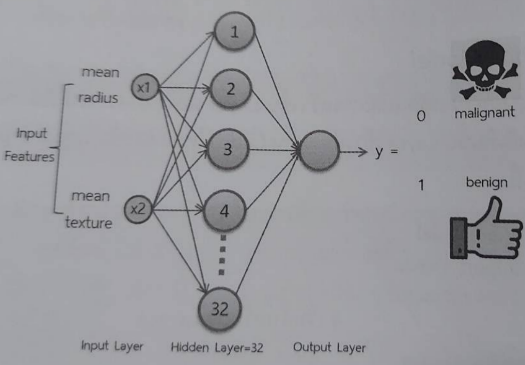

NN Model มีโครงสร้างดังรูปนี้

In [ ]:
model.summary()

Model: "my_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 2)]               0         
                                                                 
 dense_4 (Dense)             (None, 32)                96        
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 129 (516.00 Byte)
Trainable params: 129 (516.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


ดูโครงสร้างของ NN มีรายละเอียดดังนี้
- Output Shape คือ มิติของเอาท์พุตแต่ละชั้น ก็คือจำนวน Node แต่ละชั้นนั้นเอง
- Param คือ จำนวน weight รวมที่มี ยิ่งมีจำนวน Node มาก ค่า Param ก็มากตามด้วย

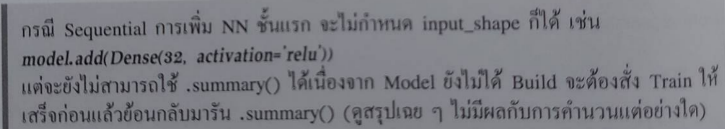

In [ ]:
model.get_config()

{'name': 'my_model',
 'trainable': True,
 'layers': [{'module': 'keras.layers',
   'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 2),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'registered_name': None,
   'name': 'input_1',
   'inbound_nodes': []},
  {'module': 'keras.layers',
   'class_name': 'Dense',
   'config': {'name': 'dense_4',
    'trainable': True,
    'dtype': 'float32',
    'units': 32,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'module': 'keras.initializers',
     'class_name': 'GlorotUniform',
     'config': {'seed': None},
     'registered_name': None},
    'bias_initializer': {'module': 'keras.initializers',
     'class_name': 'Zeros',
     'config': {},
     'registered_name': None},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'registered_name': None,
 

ดูรายละเอียดในแต่ละชั้น

In [ ]:
model.output_shape

(None, 1)

ดูมิติหรื Shape ของ Outut Layer

## Compile

เป็นการสั่งคอมไพล์ โดยกำหนดพารามิเตอร์ การวัดค่า Loss, Optimizer (จะกล่าวถึงภายหลัง) และมิติการวัด(Metrics) เช่น...

In [ ]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

## Train

เมื่อ Compile เรียบร้อยแล้ว สั่ง train ด้วย .fit() ซึ่งพารามิเตอร์สำหรับการ Train ประกอบด้วย
- X, y คือข้อมูล Feature และ Label (เหมือน Supervised Learning ทั่วๆไป)
- epochs จำนวนรอบในการทำ Backpropagation ปรับ weight
- batch_size จำนวนข้อมูล (จำนวน Sample) ที่นำเข้าประมวลผลในแต่ละครั้ง
- validation_split คือ สัดส่วนในการแบ่งข้อมูลมาเป็นตัวประเมินทดสอบ หรือ Validate
- verbose=1 ให้แสดงรายละเอียดสถานะในแต่ละ Epoch ถ้าไม่ต้องการให้แสดง ก็ตั้ง verbose=0 ระบบจะ Train แบบเงียบๆ

In [ ]:
import time

start = time.time()       # เวลาเริ่มต้น (สำหรับจับเวลาในการ Train)
history = model.fit(X_train, y_train, epochs=20, verbose=1,
                    batch_size=32, validation_split=0.25)
end = time.time()       # เวลาที่ Train เสร็จ
print("Time Taken: {:.3f} secs".format(end-start))

Epoch 1/20
10/10 [==============================] - 1s 30ms/step - loss: 0.6288 - accuracy: 0.6959 - val_loss: 0.6152 - val_accuracy: 0.7009
Epoch 2/20
10/10 [==============================] - 0s 6ms/step - loss: 0.5939 - accuracy: 0.7900 - val_loss: 0.5848 - val_accuracy: 0.7850
Epoch 3/20
10/10 [==============================] - 0s 7ms/step - loss: 0.5623 - accuracy: 0.8495 - val_loss: 0.5569 - val_accuracy: 0.8224
Epoch 4/20
10/10 [==============================] - 0s 7ms/step - loss: 0.5337 - accuracy: 0.8809 - val_loss: 0.5309 - val_accuracy: 0.8318
Epoch 5/20
10/10 [==============================] - 0s 7ms/step - loss: 0.5070 - accuracy: 0.8871 - val_loss: 0.5070 - val_accuracy: 0.8318
Epoch 6/20
10/10 [==============================] - 0s 7ms/step - loss: 0.4822 - accuracy: 0.8934 - val_loss: 0.4854 - val_accuracy: 0.8505
Epoch 7/20
10/10 [==============================] - 0s 8ms/step - loss: 0.4598 - accuracy: 0.8997 - val_loss: 0.4653 - val_accuracy: 0.8598
Epoch 8/20
10/10 [=

- ขณะ Train จะรายงานสถานะแต่ละ Epoch โดยจากตัวอย่าง แต่ละ Epoch มีการวนรอบย่อย(Iterations) จำนวน 8 ครั้ง ซึ่ง คือการแบ่งข้อมูลเข้าไปคำนวณตามจำนวน batch_size
- loss คือ ค่า loss หรือ Error ที่คำนวณได้ในแต่ละ Epoch
- accuracy คือ ค่าความแม่นยำ(ค่าที่ได้ อาจแตกต่างกัน)
- val_loss, val_accuracy คือค่า Error และค่าความแม่นยำในการประเมินแต่ Epoch โดยใช้ข้อมูล (Samples) ที่แบ่งมาจาก X_train(แบ่งตามที่ระบุใน validation_split)
- loss จะลดลงรื่อยๆ เมื่อ Epoch สูงขึ้น (ระบบเรียนรู้และปรับ weight ดีขึ้น) ส่วน accuracy จะสูงขึ้นเรื่อยๆ(ทั้ง loss และ accuracy อาจมีแกว่งบ้างในแต่ละ Epoch)

เมื่อ Train เสร็จ ทำการประเมินทดสอบ Model ด้วย Test ที่แบ่งไว้

In [ ]:
score = model.evaluate(X_test, y_test, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Test loss: 0.3719814717769623
Test accuracy: 0.8251748085021973


## ทดสอบ

นำข้อมูล Test(X_test) เข้าทดสอบ

In [ ]:
y_pred_pr = model.predict(X_test)
y_pred_pr[:4]     # แสดงผลของการทำนาย 4 ตัวแรก

5/5 [==============================] - 0s 3ms/step


array([[0.18325037],
       [0.23931652],
       [0.13728198],
       [0.76750195]], dtype=float32)

ผลลัพธ์ของการ predict จะได้ความน่าจะเป็นของคลาส 1(ความน่าจะเป็น y=1) เช่น ลำดับแรก หมายถึงความน่าจะเป็นที่จะเป็นคลาส1 มีเพียง 0.11 ถ้าใช้ Threshold ตัดแบ่งที่ 0.5 ก็แสดงว่าเคสแรกนี้คลาสเป็น 0 นั้นคือเป็นเนื้อร้าย(Malignant)

เพื่อแสดงผลลัพธ์ว่า เป็นเนื้อดีหรือร้าย ให้ใช้ Threshold ตัดแบ่งที่ 0.5 ดังนี้

In [ ]:
y_pred = (y_pred_pr > 0.5).astype(int)
# y_pred = np.where(y_pred_pr > 0.5, 1, 0)      # ใช้แบบนี้ก็ได้
y_pred[:4]     # แสดงผลของการทำนาย 4 ตัวแรก

array([[0],
       [0],
       [0],
       [1]])

ลองดู Confusion Matrix

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print('Score->', score[1])
print(classification_report(y_test, y_pred, target_names=class_names))
# class_names = array(['benign', 'malignant'], dtype=object)

print(confusion_matrix(y_test, y_pred))

Score-> 0.8251748085021973
              precision    recall  f1-score   support

      benign       0.85      0.86      0.86        88
   malignant       0.78      0.76      0.77        55

    accuracy                           0.83       143
   macro avg       0.82      0.81      0.81       143
weighted avg       0.82      0.83      0.82       143

[[76 12]
 [13 42]]


## plot ดูค่า loss

ในระหว่างการ Train ระบบจะเก็บประวัติค่า Loss และ Accuracy ในช่วงระหว่างการ Train เพื่อประกอบการวิเคราะห์ สามารถพล็อตดูได้

In [ ]:
df_hist = pd.DataFrame.from_dict(history.history)
history.params
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

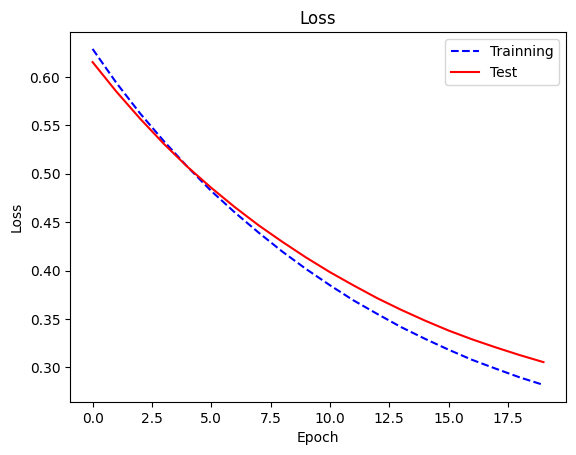

In [ ]:
df_hist['loss'].plot(style='b--',label='Trainning')
df_hist['val_loss'].plot(style='r-',label='Test')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')
plt.show()

 เส้นทึบคือเส้นกราฟ Validation ที่ได้จากการแบ่ง X ไปเป็นตัว Validate ในการ Train




## การใช้ Tensor Board

พล็อตดูค่า Loss และ Accuracy ด้วย Tensor Board แทน matplotlib โดยเปลี่ยนมา Train ด้วย .fit() ที่กำหนด callbacks ให้เก็บข้อมูล log ดังนี้

In [ ]:
from keras.callbacks import TensorBoard

history = model.fit(X_train, y_train, epochs=30, verbose=0,     # verbose = 0 หรือ 1 ก็ได้
                    batch_size=32, validation_split=0.25,
                    callbacks=[TensorBoard(log_dir='./log')])

หลัง Train เสร็จแล้วต้องการดูพล็อต ให้รันโค้ดตามนี้ แล้วดูกราฟที่ต้องการ

In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./log

Output hidden; open in https://colab.research.google.com to view.

## plot ขอบเขตการจำแนกของ Model

9600/9600 [==============================] - 16s 2ms/step


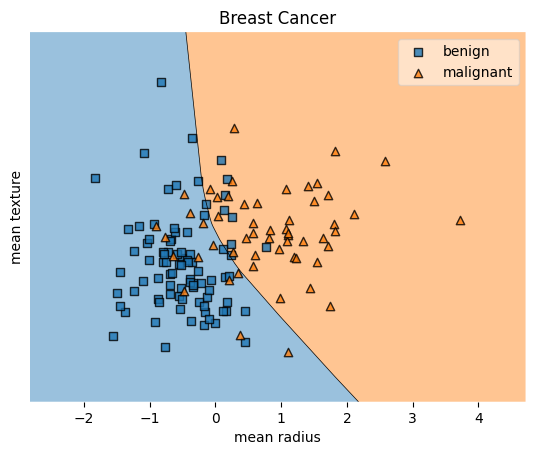

In [ ]:
from mlxtend.plotting import plot_decision_regions
ax = plot_decision_regions(X_test, y_test, clf=model)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, class_names, framealpha=0.5)

plt.title('Breast Cancer')
plt.yticks([])
plt.xlabel('mean radius')
plt.ylabel('mean texture')
plt.show()

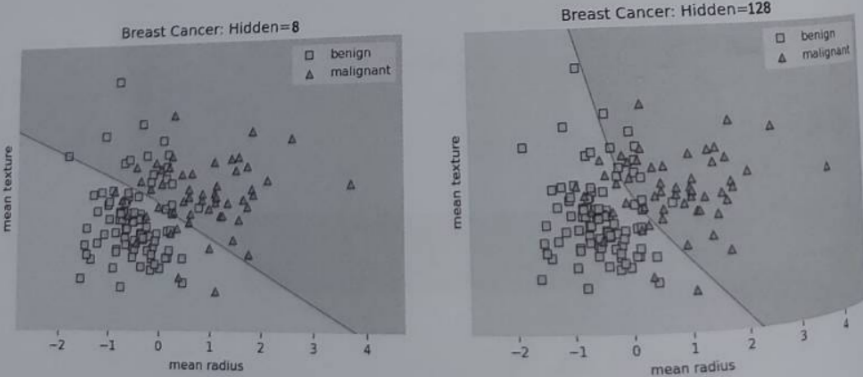
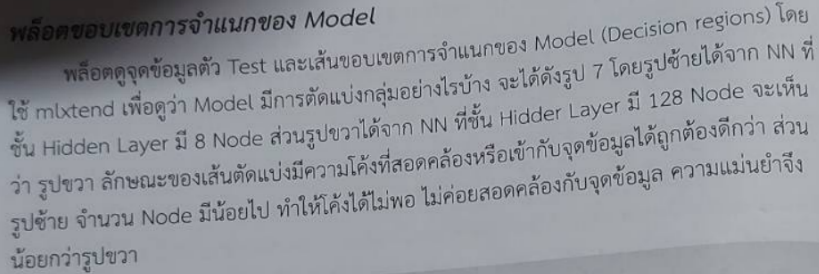

## ใช้งาน Predict ทำนาย

การใช้งาน Predict ให้นำข้อมูลมาเข้า Standard scale(sc) ก่อน แล้วจึงส่งเข้า Model

In [ ]:
# X_new = [[16.4, 14.1]]      # กรณีข้อมูลเคสเดียว
X_new = [[16.4, 14.1],       # กรณีข้อมูลหลายเคส
                [18.5, 15.1]]
# X_new = X[104:110]      # กรณีเอาข้อมูลใน Dataset มาลอง

X_new_sc = sc.transform(X_new)      # ข้อมูลที่ผ่านการทำ Standard scale แล้ว
X_new_sc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


array([[ 0.64548141, -1.20766604],
       [ 1.24191122, -0.97495933]])

In [ ]:
y_pred_pr = model.predict(X_new_sc)     # Predict
y_pred = (y_pred_pr > 0.5).astype(int)    # เปรียบเทียบกับค่า Threshold
print(class_names[y_pred])

1/1 [==============================] - 0s 31ms/step
[['benign']
 ['malignant']]


พล็อตดูจุดข้อมูลที่ให้ predict และเส้นขอบเขตการจำแนกของ Model (Decision regions)

9600/9600 [==============================] - 19s 2ms/step


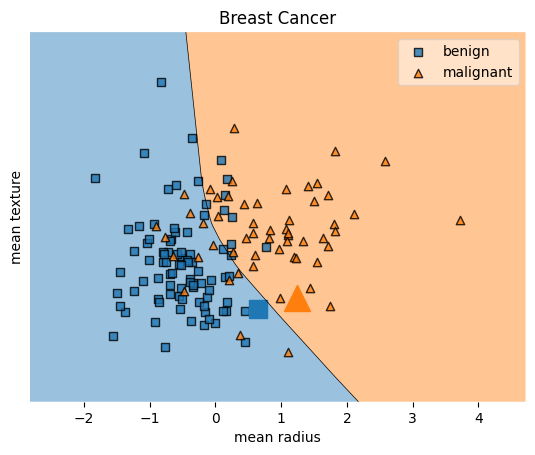

In [ ]:
from mlxtend.plotting import plot_decision_regions
y_pred = y_pred.reshape(1, -1)[0]     # ทำให้เป็น 1D Row Vector เช่น array([0, 1, 1, 0])

ax = plot_decision_regions(X_test, y_test, clf=model)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, class_names, framealpha=0.5)
plt.title('Breast Cancer')
plt.yticks([])
plt.xlabel('mean radius')
plt.ylabel('mean texture')

# จุดข้อมูลใหม่ที่ Predict (New data points)
plt.scatter(X_new_sc[:,0][y_pred==0], X_new_sc[:,1][y_pred==0],
            marker='s', s=180)
plt.scatter(X_new_sc[:,0][y_pred==1], X_new_sc[:,1][y_pred==1],
            marker='^', s=350)
plt.show()

ทดลองสร้าง Model โดยกำหนดชั้น Hidden Layer มี Node จำนวนต่างๆ เช่น 8 16 64 แล้วพล็อตดูขอบเขตการจำแนก จะพบว่า Node น้อยเกินไป เส้นแบ่งจะโค้งน้อยหรือโค้งไม่พอ ความแม่นยำมีน้อยกว่า(ค่า Accuracy น้อยกว่า)

## Epochs และ batch_size

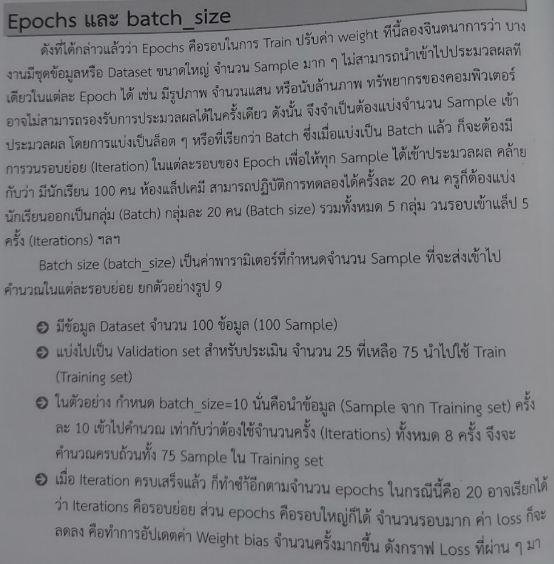

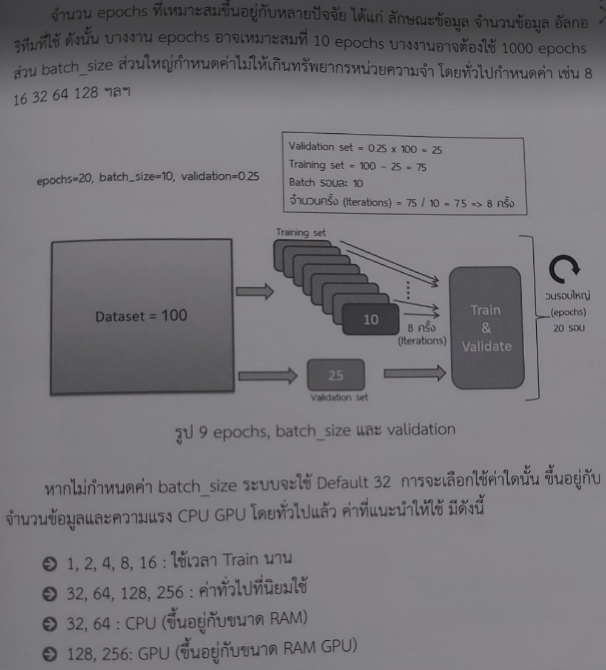

## วิเคราะห์ Model

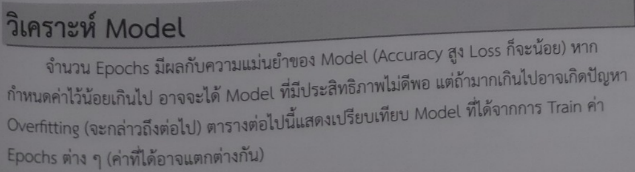

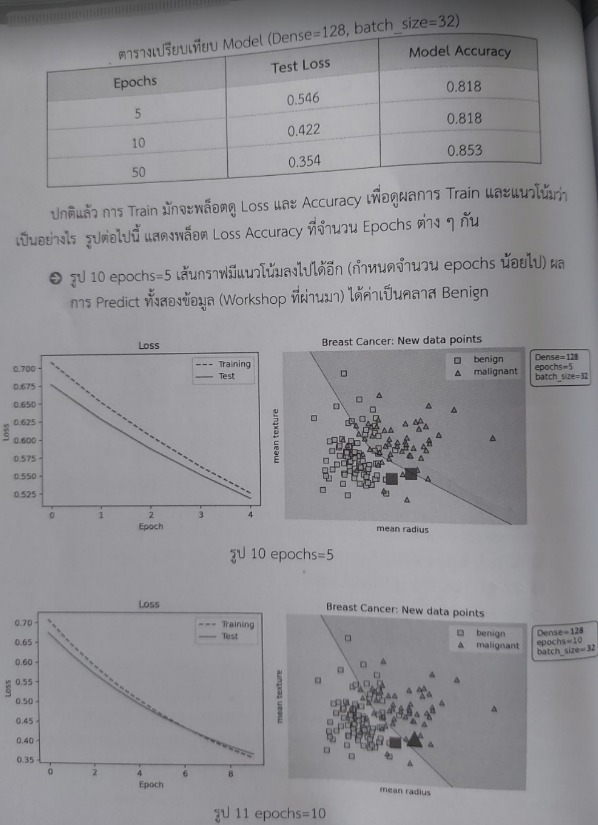

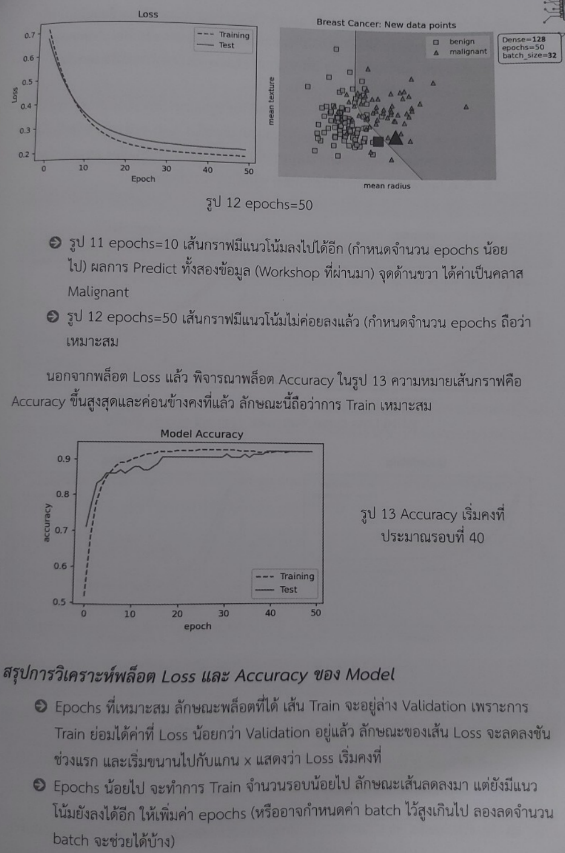

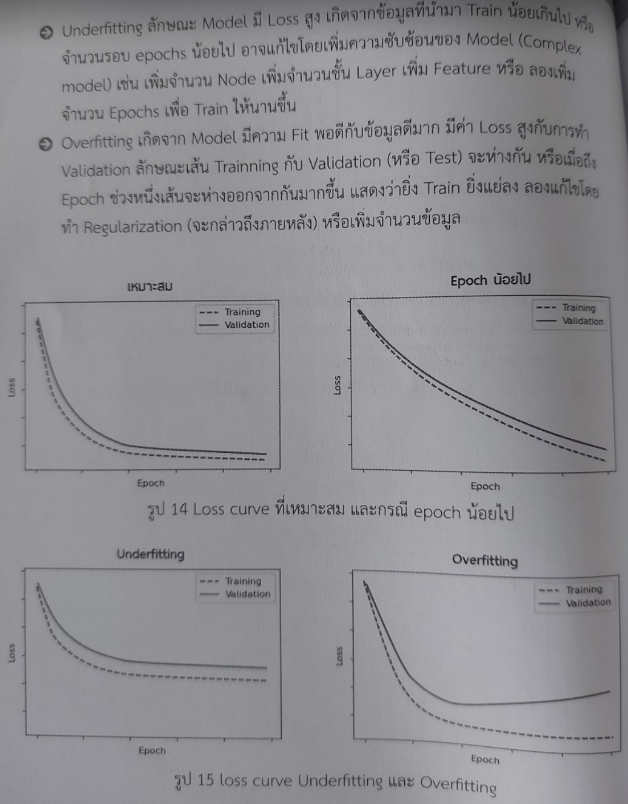

# (3.): การบันทึก model ไว้ใช้งาน

In [ ]:
model.save('./mymodel.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


แบบแรก บันทึกเป็น .h5 หรือ Keras H5

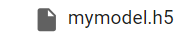

In [ ]:
model.save('.mymodel')

แบบสอง บันทึกเป็นโฟลเดอร์ที่มีไฟล์หลายๆไฟล์เก็บไว้

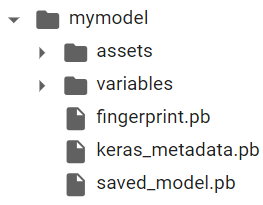

# (4.): การบันทึก Scalar และ Class names

บันทึก Scaler(sc) ที่ได้จาก Standard Scaler ด้วย เพราะต้องเอาไปใช้เมื่อใช้งาน Model เพื่อ Predict

In [ ]:
import pickle
pickle.dump(sc, open('./scaler.pkl', 'wb'))

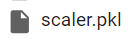

นอกจาก Scaler แล้ว ให้บันทึกเก็บข้อมูล Class names ไว้ด้วย เพื่อใช้ถอดรหัสผลการ Predict จาก 0 1 มาเป็นชื่อคลาส (เช่น benign, malignant)

In [ ]:
file_name = "classname.pkl"

open_file = open(file_name, "wb")
pickle.dump(class_names, open_file)
open_file.close()

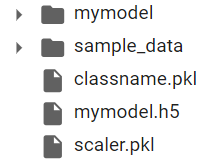

# (5.): การโหลด Model มาใช้งาน

ให้ทำการโหลด Model, Scaler และ ชื่อ Class names ดังนี้

In [ ]:
from tensorflow.keras.models import load_model    # lib load model
my_model = load_model('./mymodel.h5')   # กรณีโหลดไฟล์ Model .h5
# my_model = load_model('./mymodel')   # กรณีโหลดจากที่บันทึกไว้ด้วย Folder

Model ที่โหลดมาสามารถนำไป Train ได้ โดยไม่ต้อง Compile ใหม่ (นำ Model ที่ยัง Train ไม่เสร็จไป Train ต่อได้)

In [ ]:
my_model.summary()    # ลองตรวจดูโครงสร้าง จะได้เหมือนหัวข้อ (2.)

Model: "my_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 2)]               0         
                                                                 
 dense_4 (Dense)             (None, 32)                96        
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 129 (516.00 Byte)
Trainable params: 129 (516.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
my_model.get_config()    # ได้รายละเอียดแต่ละ Layer เช่น activation จำนวน Node

{'name': 'my_model',
 'trainable': True,
 'layers': [{'module': 'keras.layers',
   'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 2),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'registered_name': None,
   'name': 'input_1',
   'inbound_nodes': []},
  {'module': 'keras.layers',
   'class_name': 'Dense',
   'config': {'name': 'dense_4',
    'trainable': True,
    'dtype': 'float32',
    'units': 32,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'module': 'keras.initializers',
     'class_name': 'GlorotUniform',
     'config': {'seed': None},
     'registered_name': None},
    'bias_initializer': {'module': 'keras.initializers',
     'class_name': 'Zeros',
     'config': {},
     'registered_name': None},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'registered_name': None,
 

โหลด Scaler

In [ ]:
import pickle
sc2 = pickle.load(open('./scaler.pkl', 'rb'))

โหลดชื่อ Class names สำหรับถอดรหัสผลการ Predict ว่า 0 1 คือ คลาสอะไร

In [ ]:
file_name = "classname.pkl"
open_file = open(file_name, "rb")
class_names = pickle.load(open_file)    # load file
open_file.close()

class_names

array(['benign', 'malignant'], dtype=object)

การใช้งาน เหมือนเดิม คือปรับสเกลข้อมูลเป็น Standard scale ก่อน จากนั้น Predict

In [ ]:
X_new = [[16.4, 14.1],       # กรณีข้อมูลหลายเคส
                [18.5, 15.1],
                [17.7, 18.7]]

X_new_sc = sc.transform(X_new)      # Standard scale
X_new_sc

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


array([[ 0.64548141, -1.20766604],
       [ 1.24191122, -0.97495933],
       [ 1.01469986, -0.13721517]])

In [ ]:
y_pred_pr = my_model.predict(X_new_sc)    # Predict
y_pred = (y_pred_pr > 0.5).astype(int)
y_pred

1/1 [==============================] - 0s 146ms/step


array([[0],
       [1],
       [1]])

ถอดรหัส 0 1 ว่าคลาสอะไร

In [ ]:
print(class_names[y_pred])

[['benign']
 ['malignant']
 ['malignant']]


พล็อตจุดข้อมูล และ ขอบเขตการจำแนกขอ Model

9600/9600 [==============================] - 24s 3ms/step


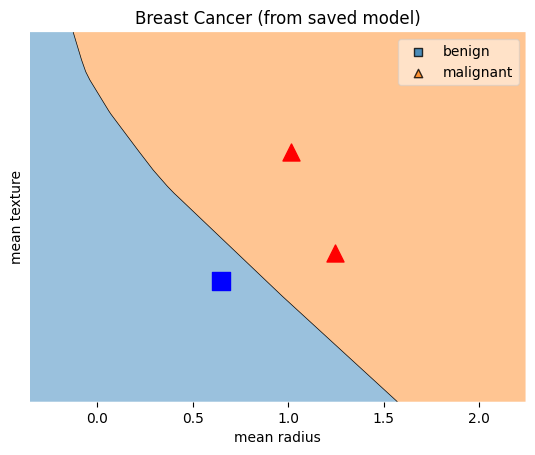

In [ ]:
import matplotlib.pyplot as plt
from mlxtend.plotting import plot_decision_regions

y = y_pred.reshape(1, -1)[0]    # ให้เป็น array 1 แถวนอน
ax = plot_decision_regions(X_new_sc, y, clf=my_model)   # model ที่โหลดมา
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, class_names, framealpha=0.5)

plt.title('Breast Cancer (from saved model)')
plt.yticks([])
plt.xlabel('mean radius')
plt.ylabel('mean texture')

# plot จุด ที่ผลลัพธ์เป็น 0 และ 1
plt.scatter(X_new_sc[:,0][y==0], X_new_sc[:,1][y==0],
            marker='s', s=150, c='b')
plt.scatter(X_new_sc[:,0][y==1], X_new_sc[:,1][y==1],
            marker='^', s=150, c='r')
plt.show()

# (6.) จำแนกดอก Iris

สร้าง Model NN ทำหน้าที่จำแนกดอก Iris โดยใช้ TensorFlow Keras ซึ่งจะต่างกับ Workshop ที่ผ่านมา
- Model เป็นแบบ Multi-class classification มี 3 คลาส (ดอก 3 สายพันธุ์) การกำหนด Node เอาต์พุตสำหรับ Model จะใช้ 3 Node
- มิติ Input สำหรับรับข้อมูล 4 Feature
- การทำ One-Hot encoding

## Setup และโหลดข้อมูลดอก Iris

In [ ]:
import pandas as pd
import numpy as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = sns.load_dataset('iris')
# df.head()
df.sample(5, random_state=1)

,sepal_length,sepal_width,petal_length,petal_width,species
14,5.8,4.0,1.2,0.2,setosa
98,5.1,2.5,3.0,1.1,versicolor
75,6.6,3.0,4.4,1.4,versicolor
16,5.4,3.9,1.3,0.4,setosa
131,7.9,3.8,6.4,2.0,virginica


ตรวจสอบเพื่อให้แน่ใจว่าไม่มี NaN (งาน NN จะต้องไม่มี Missing Data)

In [ ]:
df.isnull().sum()     # จะต้องได้ค่า 0 ทั้งหมดถึงจะไปขั้นตอนต่อไปได้

sepal_length    0
sepal_width     0
petal_length    0
petal_width     0
species         0
dtype: int64

พล็อต Scatter ดูการกระจายข้อมูล ใช้ Feature petal_length และ petal_width

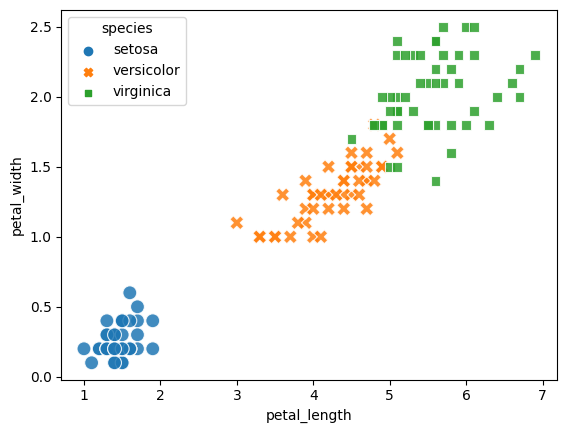

In [ ]:
sns.scatterplot(x='petal_length', y='petal_width', data=df, hue='species',
            style='species', alpha=0.85, edgecolor='w', s=100)
plt.show()

## เตรียมข้อมูล

การเตรียมข้อมูล ประกอบด้วย
- การเข้ารหัส เพื่อแทนที่ ข้อความชื่อคลาส(species) ให้เป็นตัวเลข(Label encoding)
- การปรับสเกลค่าข้อมูล Feature ให้เป็น Standard scale
- การทำคลาส(ตัวเลข) ให้เป็นแบบ One-hot encoding

การเข้ารหัสคลาส species ใหเป็นค่าตัวเลข ทำได้ 2 วิธี จะใช้ Pandas factorize หรือ Numpy ก็ได้ (เลือกอย่างใดอย่างหนึ่ง)

In [ ]:
import pandas as pd

y, class_names = pd.factorize(df.species, sort=True)    # ใช้ Pandas
# print(pd.unique(y))       # ตรวจสอบค่า unique ที่ได้
class_names, y[45:105]

(Index(['setosa', 'versicolor', 'virginica'], dtype='object'),
 array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2]))

In [ ]:
import numpy as np

class_names, y = np.unique(df.species, return_inverse=True)    # ใช้ Numpy
class_names, y[45:105]      # ดูข้อมูลบางส่วน

(array(['setosa', 'versicolor', 'virginica'], dtype=object),
 array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2]))

จะได้ตัวแปร class_names เก็บชื่อ และตัวแปร y เก็บค่าที่เข้ารหัสแล้ว เช่น เดิม y เป็น setosa ก็จะเปลี่ยนเป็น 0 คลาส veriscolor ก็เปลี่ยนเป็น 1 ...

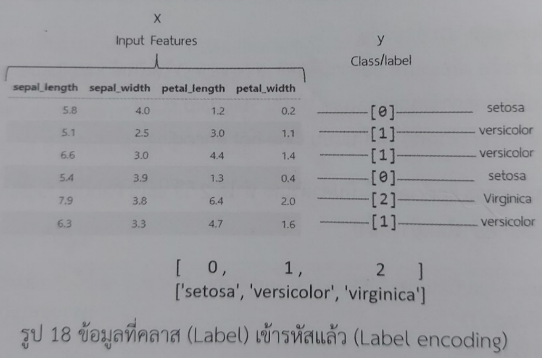

สร้างอินพุต Feature โดยตัดคอลัมน์ species ออกไป

In [ ]:
X = df.drop('species', axis=1)
X.sample(5, random_state=1)     # ดูตัวอย่างข้อมูล

,sepal_length,sepal_width,petal_length,petal_width
14,5.8,4.0,1.2,0.2
98,5.1,2.5,3.0,1.1
75,6.6,3.0,4.4,1.4
16,5.4,3.9,1.3,0.4
131,7.9,3.8,6.4,2.0


## ปรับค่าข้อมูลเป็น Standard scale

In [ ]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_sc = sc.fit_transform(X)
X_sc[:4]

array([[-0.90068117,  1.01900435, -1.34022653, -1.3154443 ],
       [-1.14301691, -0.13197948, -1.34022653, -1.3154443 ],
       [-1.38535265,  0.32841405, -1.39706395, -1.3154443 ],
       [-1.50652052,  0.09821729, -1.2833891 , -1.3154443 ]])

### Train-Test-Split

ทำการแบ่งเป็น Train และ Test (ใช้สัดส่วน Test 25%)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_sc, y, test_size=0.25
                                                    , random_state=1)
X_train.shape, X_test.shape

((112, 4), (38, 4))

Train มี 112 ข้อมูล Test มี 38 มิติ, 4 คอลัมน์

In [ ]:
y_train.shape, y_test.shape

((112,), (38,))

y (Label) มีมิติ 1 คอลัมน์

In [ ]:
y_train[:5]

array([1, 2, 2, 0, 2])

## เข้ารหัส Label แบบ One-hot encoding

แปลงค่าคลาส หรือ Label ให้เป็นค่าฐานสอง(Binary) เพื่อให้แต่ละ Node ของ NN รับผิดชอบหรือเอาต์พุตค่าของคลาส

- ใช้ to_categorical ของ Keras ในการแปลง

In [ ]:
from tensorflow.keras.utils import to_categorical

def one_hot_encode(arr):    # มี parameter คือ Numpy Array ของค่า y
  categories, ids = np.unique(arr, return_inverse=True)
  return to_categorical(ids, len(categories))

y_train_1h = one_hot_encode(y_train).astype('int')    # ทำ One-hot ทั้ง Train, Test
y_test_1h = one_hot_encode(y_test).astype('int')

y_test_1h[:4]

array([[1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [1, 0, 0]])

- ใช้ Pandas ในการแปลง ซึ่งให้ผลเหมือนกัน (เลือกซัก 1 วิธี)

In [ ]:
y_train_1h = pd.get_dummies(y_train)    # ทำ One-hot ทั้ง Train, Test
y_test_1h = pd.get_dummies(y_test)

y_test_1h[:4]

,0,1,2
0,1,0,0
1,0,1,0
2,0,1,0
3,1,0,0


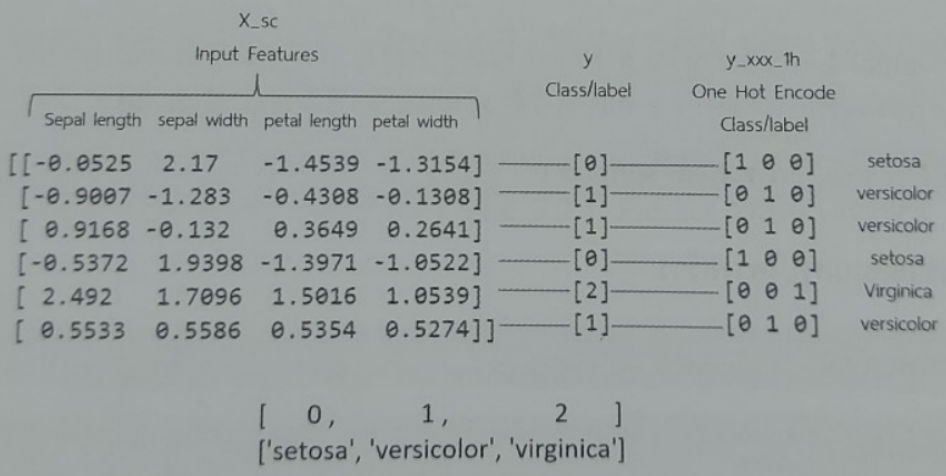

เช่น แถวแรก y คือ 0 setosa เมื่อเข้ารหัส One-hot แล้วจะได้ 1 0 0 (ไม่เกี่ยวกับฐาน2ในระบบตัวเลข แต่เป็นรหัสเพื่อใช้อ้างอิงการเอาต์พุตของ NN เท่านั้น)

In [ ]:
y_train_1h.shape, y_test_1h.shape

((112, 3), (38, 3))

จำนวน rows เท่าเดิม, จำนวนคอลัมน์กลายเป็น 3 (เทียบกับ y_train ก่อนหน้านี้จะมี 1 คอลัมน์)

In [ ]:
X_train[:4]

array([[ 0.79566902, -0.59237301,  0.47857113,  0.3957741 ],
       [ 1.03800476, -1.28296331,  1.16062026,  0.79067065],
       [ 1.15917263, -0.13197948,  0.99010798,  1.18556721],
       [-0.90068117,  1.01900435, -1.34022653, -1.18381211]])

In [ ]:
y_test_1h[:4]

array([[1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [1, 0, 0]])

## สร้าง Model NN

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

model = Sequential()    # เริ่มต้นสร้าง Instance

# เพิ่มชั้น Layer มีจำนวน 64 Node โดยกำหนดให้ใช้ Activation function ReLU
# input_shape คือมิติรับอินพุต ซึ่งในตัวอย่างนี้คือ 4 Feature
model.add(Dense(64, activation='relu', input_shape=(4,)))

"""
เพิ่มชั้น Output Layer มีจำนวน 3 Nodes (ใช้ 3 เนื่องจาก y_train_1h
ที่เป็น One-hot มีมิติ 3 คอลัมน์ เพื่อรองรับการจำแนก 3 คลาส)
ใช้ Activation function Sigmoid
"""
model.add(Dense(3, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 64)                320       
                                                                 
 dense_5 (Dense)             (None, 3)                 195       
                                                                 
Total params: 515 (2.01 KB)
Trainable params: 515 (2.01 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model.output_shape      # มิติ Output

(None, 3)

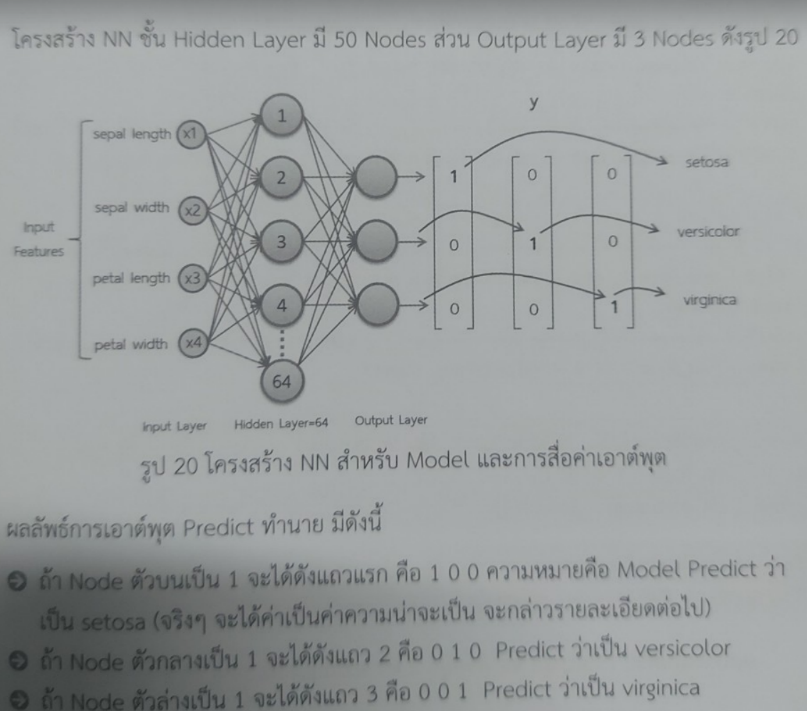

## Complie

เนื่องจาก Model นี้เป็นแบบ Multi-class classification จำแนก 3 คลาส

การ Complie จะเป้นตัววัด Loss เป็น categorical...(ตัวอย่างของระบบมะเร็งที่ผ่านมา มี 2 คลาส ใช้ Binary...)

In [ ]:
model.compile(loss='categorical_crossentropy',    # <----
              optimizer='adam',
              metrics=['accuracy'])

## Train Model และ ประเมิน

ใช้ข้อมูล One-hot(y_train_1h) ในการ Train

In [ ]:
history = model.fit(X_train, y_train_1h, epochs=100, batch_size=8, verbose=1, validation_split=0.25)

Epoch 1/100
11/11 [==============================] - 1s 26ms/step - loss: 1.1151 - accuracy: 0.3452 - val_loss: 0.9831 - val_accuracy: 0.3929
Epoch 2/100
11/11 [==============================] - 0s 5ms/step - loss: 0.9635 - accuracy: 0.5357 - val_loss: 0.8834 - val_accuracy: 0.6071
Epoch 3/100
11/11 [==============================] - 0s 4ms/step - loss: 0.8395 - accuracy: 0.6786 - val_loss: 0.8053 - val_accuracy: 0.6786
Epoch 4/100
11/11 [==============================] - 0s 5ms/step - loss: 0.7290 - accuracy: 0.7857 - val_loss: 0.7381 - val_accuracy: 0.6786
Epoch 5/100
11/11 [==============================] - 0s 5ms/step - loss: 0.6422 - accuracy: 0.8214 - val_loss: 0.6814 - val_accuracy: 0.6786
Epoch 6/100
11/11 [==============================] - 0s 6ms/step - loss: 0.5718 - accuracy: 0.8095 - val_loss: 0.6354 - val_accuracy: 0.6786
Epoch 7/100
11/11 [==============================] - 0s 4ms/step - loss: 0.5127 - accuracy: 0.8333 - val_loss: 0.5957 - val_accuracy: 0.7143
Epoch 8/100


In [ ]:
score = model.evaluate(X_test, y_test_1h, verbose=0)
print("Test loss:", score[0])             # Loss
print("Test accuracy:", score[1])      # Accuracy

Test loss: 0.08460773527622223
Test accuracy: 0.9736841917037964


In [ ]:
print(score)
model.metrics_names

[0.08460773527622223, 0.9736841917037964]


['loss', 'accuracy']

In [ ]:
y_pred = model.predict(X_test)

#y_pred[:4]
y_pred[:4].round(3)   # ถ้าต้องการปัดเศษ

2/2 [==============================] - 0s 13ms/step


array([[0.999, 0.001, 0.   ],
       [0.054, 0.932, 0.014],
       [0.002, 0.955, 0.043],
       [0.999, 0.001, 0.   ]], dtype=float32)

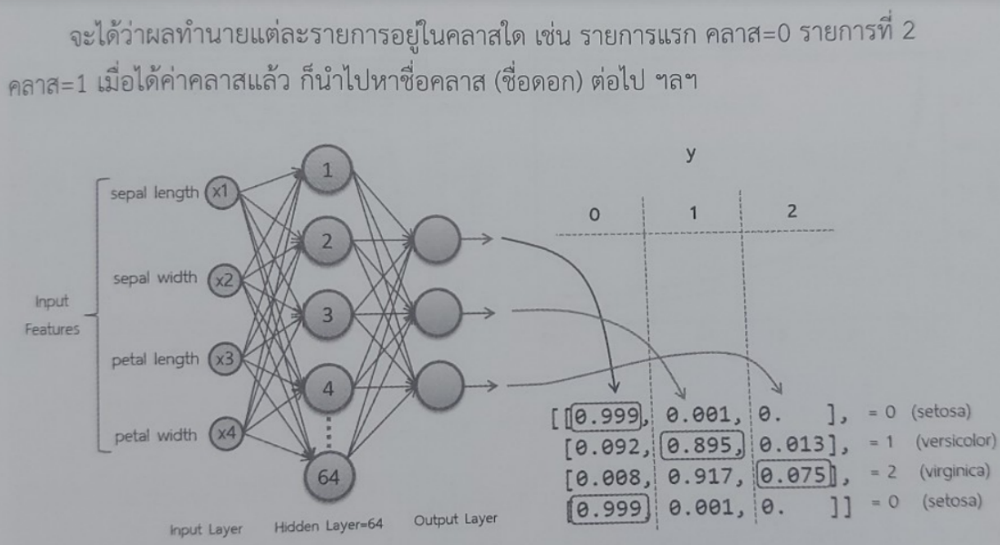

การใช้ Activation funstion แบบ Softmax ที่ Output Layer จะให้ผลลัพธ์เป็นค่าความน่าจะเป็น(Probability) ของแต่ละคลาส (รวมค่าความเชื่อมั่นแต่ละ row จะได้ค่าเท่ากับ 1.0)
- จากรายการแรกที่ทำนายได้ คือ [0.99 0.001 0] ความหมายคือ Model มีความเชื่อมั่น 99.9% ว่าเป็นคลาสแรก(Setosa), มีความเชื่อมั่น 0.1% ว่าเป็นคลาสที่สอง(Versicolor), มีความเชื่อมั่น 0% ว่าเป็นคลาสที่สาม(Virginica) ดังนั้น ใช้ค่าเชื่อมั่นสูงสุด สรุปว่า รายการแรกเป็น Setosa

ตรวจสอบว่า ค่าความเชื่อมั่นคลาสใดมีค่าสูงสุด .argmax() ใช้ดังนี้

In [ ]:
y_pred_cat = np.argmax(y_pred, axis=1)
y_pred_cat[:5]

array([0, 1, 1, 0, 2])

ดูผลการประเมินด้วย Confusion Matrix พบว่ามี Predict ผิด 1 รายการ

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred_cat, target_names=class_names))
print(confusion_matrix(y_test, y_pred_cat))

              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        13
  versicolor       1.00      0.94      0.97        16
   virginica       0.90      1.00      0.95         9

    accuracy                           0.97        38
   macro avg       0.97      0.98      0.97        38
weighted avg       0.98      0.97      0.97        38

[[13  0  0]
 [ 0 15  1]
 [ 0  0  9]]


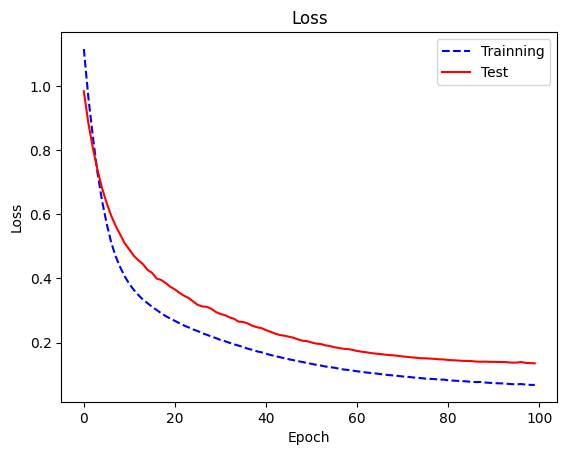

In [ ]:
df_hist = pd.DataFrame.from_dict(history.history)
df_hist['loss'].plot(style='b--', label='Trainning')
df_hist['val_loss'].plot(style='r-', label='Test')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')
plt.show()

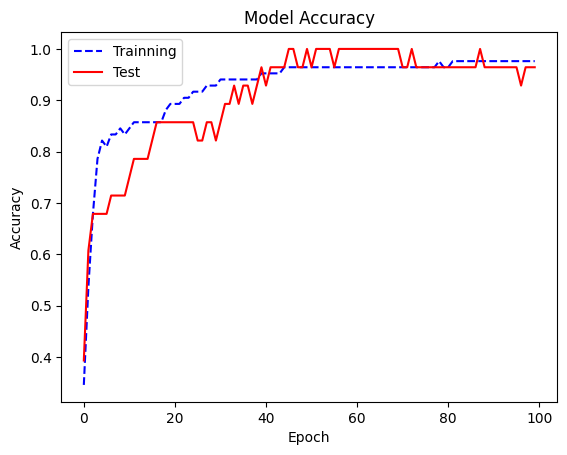

In [ ]:
df_hist['accuracy'].plot(style='b--', label='Trainning')
df_hist['val_accuracy'].plot(style='r-', label='Test')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')
plt.show()

## การใช้งาน Model เพื่อ Predict

นำข้อมูลอินพุตที่ผ่านการปรับค่าสเกลใหเป็น Standard scale ก่อน

In [ ]:
X_new = [[8.1, 4.0, 5.9, 2.1],
         [6.8, 3.6, 3.5, 1.4]]

X_new_sc = sc.transform(X_new)    # ปรับให้เป็น Standrad scale
X_new_sc

array([[ 1.,  1.,  1.,  1.],
       [-1., -1., -1., -1.]])

Model Predict จะได้ค่าความเชื่อมั่น จากนั้น .argmax() หาว่าอยู่คลาสใด

In [ ]:
y_pred_pr = model.predict(X_new_sc)
y_pred = np.argmax(y_pred_pr, axis=1)
print(class_names[y_pred])
y_pred

1/1 [==============================] - 0s 29ms/step
['virginica' 'setosa']


array([2, 0])

ผล Predict ของข้อมูลตัวแรก และตัวที่สอง

## Boundary

พล็อตดูขอบเขตการจำแนก เนื่องจากเอาต์พุตที่ได้จาก Model มีรูปแบบเป็น One-hot จะต้องสร้าง Class แปลงดังนี้ (หมายถึง Class OOP ไม่ใช่คลาส Predict)

In [ ]:
class Onehot2Int(object):
  def __init__(self, model):
    self.model = model
  def predict(self, X):
    y_pred = self.model.predict(X)
    return np.argmax(y_pred, axis=1)

model_no_ohe = Onehot2Int(model)    # อ่าน model One-hot ให้เป็นธรรมดา(no one-hot)
model_no_ohe

จากนั้นทำการพล็อต เนื่องจากงานนี่มี 4 Feature การพล็อตจะต้องเอาเพียง 2 เท่านั้น เนื่องจากกราฟพล็อตได้ 2 ระนาบ(x, y)

9600/9600 [==============================] - 17s 2ms/step


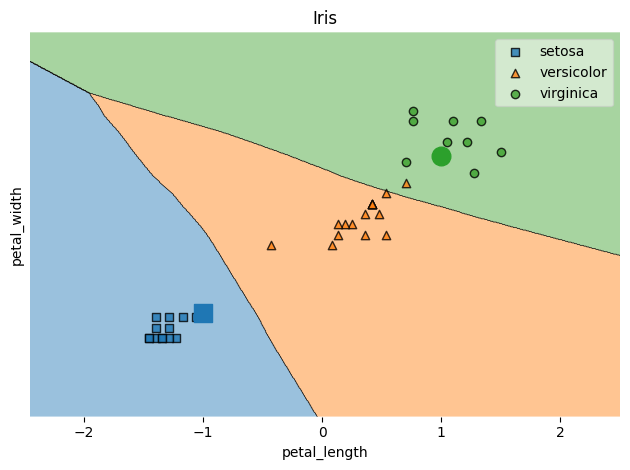

In [ ]:
from mlxtend.plotting import plot_decision_regions

value = 0     # ค่าของข้อมูลที่จะพล็อต
width = 5.5   # ค่าช่วงความกว้าง + - (ช่วงข้อมูล)
ax = plot_decision_regions(X_test, np.array(y_test),
                           clf=model_no_ohe,    # ใช้ no one-hot
                           feature_index=[2, 3],  # ใช้ Feature 2 และ 3
                           filler_feature_values={0:value, 1:value},    # ระบุค่า value
                           filler_feature_ranges={0:width, 1:width},
                           legend=2)    # ตำแหน่ง legend

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, class_names, framealpha=0.5)
plt.title('Iris')
plt.yticks([])
plt.xlabel('petal_length')    # X_new_sc[:,2], Feature 2
plt.ylabel('petal_width')     # X_new_sc[:,3], Feature 3

# plot จุดข้อมูลใหม่ ที่ให้ Predict 0 1 2 คือ ชนิดดอก
plt.scatter(X_new_sc[:,2][y_pred==0], X_new_sc[:,3][y_pred==0],marker='s', s=180)
plt.scatter(X_new_sc[:,2][y_pred==1], X_new_sc[:,3][y_pred==1],marker='^', s=180)
plt.scatter(X_new_sc[:,2][y_pred==2], X_new_sc[:,3][y_pred==2],marker='o', s=180)
plt.tight_layout()
plt.show()

จุดทึบ 2 จุดใหญ่ คือข้อมูลใหม่ที่ Predict จาก Model ทำนายว่าเป็น 'virginica' และ 'setosa'

## ทดลอง

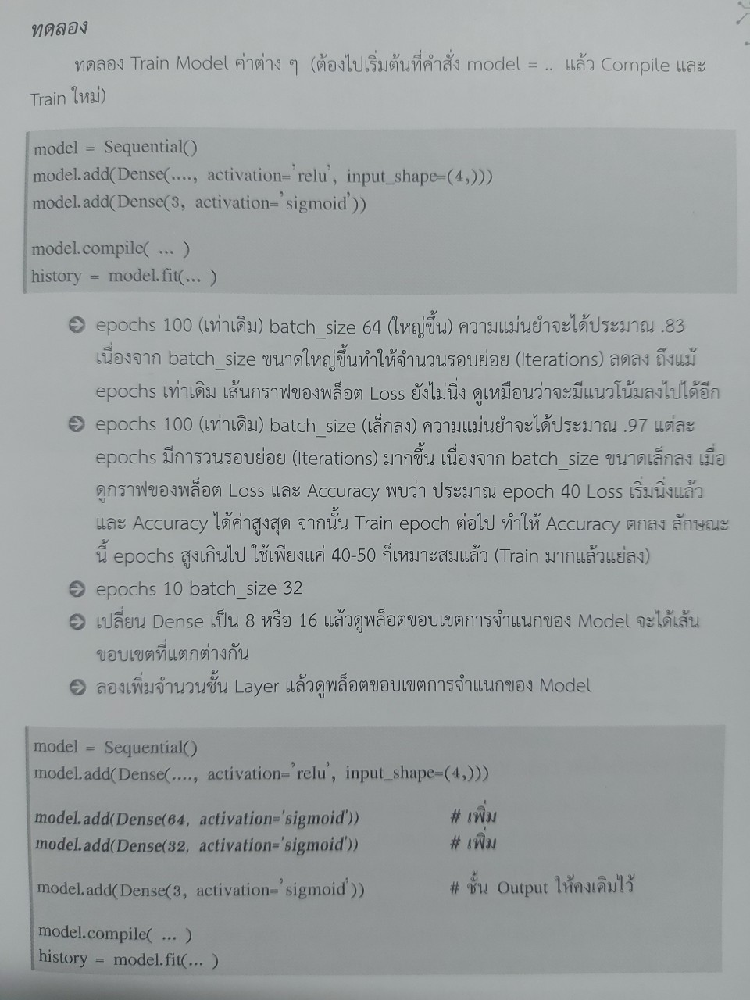

# สรุป

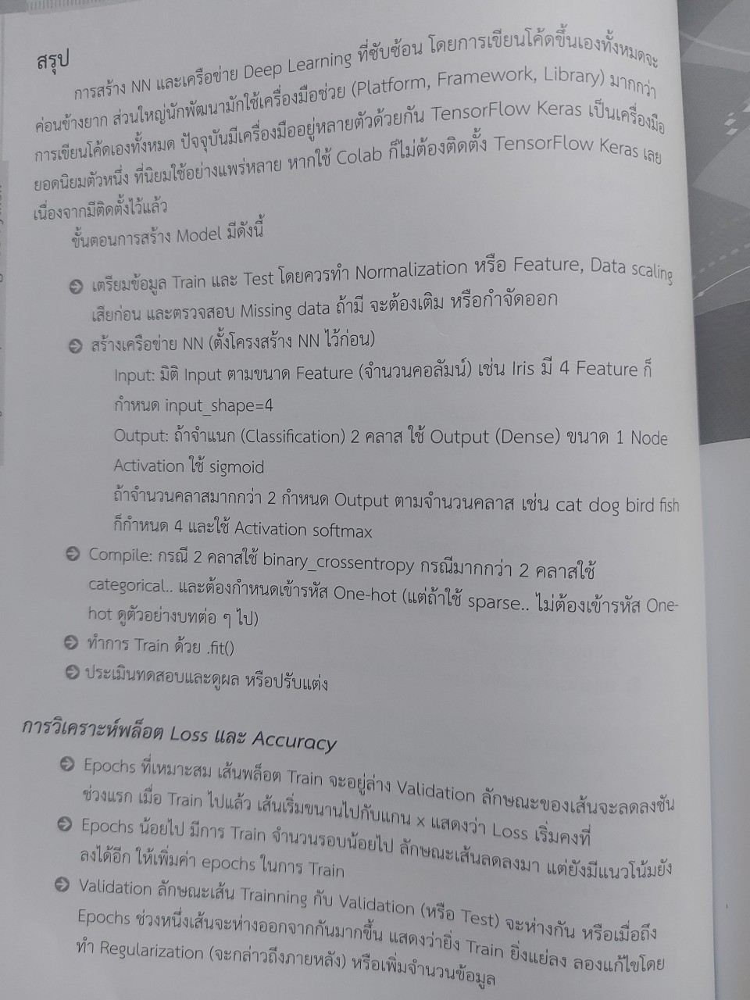